In [1]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Times New Roman"
plt.rcParams["mathtext.it"] = "Times New Roman:italic"
plt.rcParams["mathtext.bf"] = "Times New Roman:bold"

from itertools import product
import os
import h5py
from tqdm import tqdm

#few utils
from few.utils.utility import get_p_at_t, get_mismatch, get_overlap
#few trajectory
from few.trajectory.inspiral import EMRIInspiral
from few.trajectory.ode import KerrEccEqFlux
#few waveform
from few.waveform import FastKerrEccentricEquatorialFlux, GenerateEMRIWaveform
from few.utils.constants import YRSID_SI

from few.amplitude.romannet import RomanAmplitude
from few.utils.modeselector import ModeSelector
from few.utils.ylm import GetYlms

#sef imports
from stableemrifisher.fisher import StableEMRIFisher
from stableemrifisher.utils import generate_PSD, padding, inner_product
from stableemrifisher.fisher.derivatives import derivative

#LISAanalysistools imports
from fastlisaresponse import ResponseWrapper  # Response function 
from lisatools.detector import ESAOrbits, EqualArmlengthOrbits #ESAOrbits correspond to esa-trailing-orbits.h5, EqualArmlengthOrbits are equalarmlength-orbits.h5

from lisatools.sensitivity import get_sensitivity, A1TDISens, E1TDISens, T1TDISens

import few

use_gpu = False

if not use_gpu:
    
    #tune few configuration
    cfg_set = few.get_config_setter(reset=True)
    
    # Uncomment if you want to force CPU or GPU usage
    # Leave commented to let FEW automatically select the best available hardware
    #   - To force CPU usage:
    cfg_set.enable_backends("cpu")
    #   - To force GPU usage with CUDA 12.x
    #cfg_set.enable_backends("cuda12x", "cpu")
    #   - To force GPU usage with CUDA 11.x
    # cfg_set.enable_backends("cuda11x", "cpu")
    #
    cfg_set.set_log_level("info");
else:
    pass #let the backend decide for itself.

startup


In [2]:
#fixed parameters
T_LISA = 1.0 #observation time, years
dt = 10.0 #sampling interval, seconds

m1 = 1.5e6 #MBH mass in solar masses (source frame)
m2 = 15.0 #secondary mass in solar masses (source frame)
x0 = 1.0 #inclination, must be = 1.0 for equatorial model

# initial phases
Phi_phi0 = 0.0 #azimuthal phase
Phi_theta0 = 0.0 #polar phase
Phi_r0 = 0.0 #radial phase

# define the extrinsic parameters
qK = np.pi / 3  # polar spin angle
phiK = np.pi / 4  # azimuthal viewing angle
qS = np.pi / 5  # polar sky angle
phiS = np.pi / 6  # azimuthal viewing angle
dist = 1.0  # distance in Gpc. We'll adjust this later to fix the SNR as 100.0

filename = f'Maha_ae_grid_Mtot_{m1+m2}'
if not os.path.exists(filename):
    os.mkdir(filename)

calculate_Fishers = False #calculate Fishers using the full model
calculate_derivatives = False #calculate derivatives using approximate models (for CV-bias calculation)
calculate_CV_biases = False #calculate the Cutler-Valisneri biases.

kerr_traj = EMRIInspiral(func=KerrEccEqFlux)

In [3]:
#grid parameters (p and e for now)
N = 10

try:
    with h5py.File(f"{filename}/data.h5", "r") as f:
        param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
        p_range = f["p0"][:] + 0.5 #buffer
    try:
        with h5py.File(f"{filename}/data.h5", "r") as f:
            dist_range = f["dists"][:]  # Read the dataset into a NumPy array
    except KeyError:
        pass #will be handled later
        
except FileNotFoundError:
    
    a_range = np.linspace(0.1,0.9,N)
    e_range = np.linspace(0.1,0.5,N) #eccentricity above 0.5 is extremely expensive already...
    
    # Generate the Cartesian product of all parameter values
    param_grid = np.array(list((product(a_range, e_range))))
    
    p_range = []
    for i in tqdm(range(len(param_grid))):
        a = param_grid[i,0]
        e0 = param_grid[i,1]
        
        p0 = get_p_at_t(traj_module=kerr_traj, t_out=T_LISA, traj_args=[m1, m2, a, e0, x0, Phi_phi0, Phi_theta0, Phi_r0])
        
        p_range.append(p0)

        #check p for plunge trajectories
        #t, p, e, x, pp, pt, pr = kerr_traj(m1, m2, a, p0, e0, x0, Phi_phi0=Phi_phi0, Phi_theta0=Phi_theta0, Phi_r0=Phi_r0, T=T_LISA, dt=dt)
    
        #print(t[-1] - (T_LISA*YRSID_SI))
        
    p_range = np.array(p_range)

    print(param_grid.shape, p_range.shape)
    
    #save as an h5py file
    with h5py.File(f"{filename}/data.h5", "w") as f:
        f.create_dataset("gridpoints", data=param_grid)
        f.create_dataset("p0", data=p_range) #save plunging traj p0
        
    p_range += 0.5 #buffer
    
    #with h5py.File(f"{filename}/p_e_grid_data.h5", "r") as f:
    #    loaded_data = f["dataset_name"][:]  # Read the dataset into a NumPy array
    
    #print(loaded_data)
    
    plt.scatter(param_grid[:,0],param_grid[:,1])
    plt.xlabel('a range',fontsize=16)
    plt.ylabel('e0 range',fontsize=16)
    plt.savefig(f"{filename}/grid.png",dpi=300,bbox_inches='tight')
    plt.show()

In [4]:
#initialize waveform model
sum_kwargs = {
    "pad_output": True, # True if expecting waveforms smaller than LISA observation window.
}

max_step_days = 10.0 #max trajectory step size in days

inspiral_kwargs = {
    "err":1e-11, #default = 1e-11
    "max_step_size":max_step_days*24*60*60, #in seconds
}

Waveform_model = GenerateEMRIWaveform(
            "FastKerrEccentricEquatorialFlux",
            sum_kwargs=sum_kwargs,
            inspiral_kwargs=inspiral_kwargs,
            return_list=False,
            )

#setup LISA response
tdi_gen ="2nd generation"# "2nd generation"#

order = 20  # interpolation order (should not change the result too much)
tdi_kwargs_esa = dict(
    orbits=EqualArmlengthOrbits(use_gpu=use_gpu), order=order, tdi=tdi_gen, tdi_chan="AET",
)  # could do "AET"

index_lambda = 8
index_beta = 7

# with longer signals we care less about this
t0 = 10000.0  # throw away on both ends when our orbital information is weird

EMRI_TDI = ResponseWrapper(
                        waveform_gen=Waveform_model,
                        Tobs=T_LISA,
                        t0=t0,
                        dt=dt,
                        index_lambda=index_lambda,
                        index_beta=index_beta,
                        flip_hx=True,  # set to True if waveform is h+ - ihx (FEW is)
                        use_gpu=use_gpu,
                        is_ecliptic_latitude=False,  # False if using polar angle (theta)
                        remove_garbage="zero",  # removes the beginning of the signal that has bad information
                        **tdi_kwargs_esa,
                        )

In [5]:
#calculate and save SNR-adjusted dist

#calculate Fishers at each grid point
channels = [A1TDISens, E1TDISens, T1TDISens]
noise_kwargs = [{"sens_fn": channel_i} for channel_i in channels]

param_names = ['M','mu','a','p0','e0','dist','qS','phiS','qK','phiK','Phi_phi0','Phi_r0'] #M, mu are primary and secondary masses in the SEF code respectively. This will be made consistent with FEW in a later version.

sef_kwargs = {'EMRI_waveform_gen':EMRI_TDI, #EMRI waveform model with TDI response
              'param_names': param_names, #params to be varied
              'der_order':4, #derivative order
              'Ndelta':12, #number of stable points
              'stats_for_nerds': False, #true if you wanna print debugging info
              'stability_plot': True, #true if you wanna plot stability surfaces
              'use_gpu':use_gpu,
              'filename': filename, #filename
              'noise_model':get_sensitivity,
              'channels':channels,
              'noise_kwargs':noise_kwargs,
              #'suffix':i #suffix for ith EMRI source will be added inside for loop
             }

emri_kwargs = {'T': T_LISA, 'dt': dt}

try:
    with h5py.File(f"{filename}/data.h5", "r") as f:
        dist_range = f["dists"][:]  # Read the dataset into a NumPy array

except:
    
    dist_range = []
    for i in tqdm(range(len(param_grid))):
        a = param_grid[i][0]
        e0 = param_grid[i][1]
        p0 = p_range[i]
    
        param_list = [m1, m2, a, p0, e0, x0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_theta0, Phi_r0]
                
        #calculate Fisher
        sef = StableEMRIFisher(*param_list, **emri_kwargs, **sef_kwargs)
        SNR_before = sef.SNRcalc_SEF()
        dist_fact = SNR_before/100.0 #adjust distance such that SNR = 100.0
        
        param_list[6] *= dist_fact
        dist_range.append(dist*dist_fact)
    
        del sef
    
        sef = StableEMRIFisher(*param_list, **emri_kwargs, **sef_kwargs)
        SNR_after = sef.SNRcalc_SEF()
    
        print("SNR before: ", SNR_before, "SNR_after: ", SNR_after)
    
    #save as an h5py file
    with h5py.File(f"{filename}/data.h5", "a") as f:
        f.create_dataset("dists", data=np.array(dist_range))

In [6]:
def logmasstransform(Fisher, m1, m2, index_of_m1 = 0, index_of_m2 = 1):
    """ transform m1, m2 -> lnm1, lnm2. Fisher transformation: https://en.wikipedia.org/wiki/Fisher_information """
    
    J = np.eye(len(Fisher))
    J[index_of_m1,index_of_m1] = m1
    J[index_of_m2,index_of_m2] = m2

    return J.T@Fisher@J


In [7]:
def cutlervallis(waveform_truth, waveform_approx, Fisher_truth, partial_approx, params_truth, PSD_func, dt, use_gpu=False):
    """
    Calculate best-fit param points using the Cutler-Vallisneri linear-bias approximation.
    
    params:
    
        waveform_truth (ndarray) : the time-series waveform from the true template at params_truth. ndarray of shape 'N x M' where N is number of LISA channels and M is the time-series length
        waveform_approx (ndarray) : the time-series waveform from the approximate template at params_truth. ndarray of shape 'N x M' where N is number of LISA channels and M is the time-series length
        partial_approx (ndarray) : the time-series partial derivative of the approximate template at params_truth. ndarray of shape 'N x M' where N is number of LISA channels and M is the time-series length
        Fisher_truth (ndarray) : the Fisher matrix (log-mass units) at params_truth. ndarray of shape 'd x d'
        params_truth (ndarray) : the array of true params. ndarray of shape 'd'
        PSD_func (ndarray) : the frequency-domain LISA noise sensitivity curve. ndarray of shape 'N x L' where L is the length of the frequency series. 

    returns:
    
        CV_bias (ndarray): params_truth + np.linalg.inv(Fisher_truth) @ inner_product(partial_approx, waveform_truth - waveform_approx)
    """

    if use_gpu:
        xp = cp
    else:
        xp = np
        
    waveform_truth = padding(waveform_truth, waveform_approx, use_gpu = use_gpu) #make waveform_truth the same length as waveform_approx

    delta_wave = waveform_truth - waveform_approx
    
    # calculate all the column-wise inner products
    
    inn_prods = []
    
    for j in range(len(Fisher_truth)):
        
        print("delta_wave.shape, partial_approx.shape: ", delta_wave.shape, partial_approx[j].shape)
                      
        inn_prod_j = inner_product(partial_approx[j], delta_wave, PSD=PSD_func, dt=dt, use_gpu = use_gpu) #should be a scalar

        inn_prod_j = xp.asarray(inn_prod_j)
        
        print(f'inner_prod at j = {j}: ', inn_prod_j)
        
        if use_gpu:
            inn_prod_j = xp.asnumpy(inn_prod_j)
        
        inn_prods.append(inn_prod_j)
        
    inn_prods = np.array(inn_prods)
        
    # calculate all the param shifts
    
    delta_param_all = []
    
    for i in range(len(Fisher_truth)):
            
        delta_param_i = np.linalg.inv(Fisher_truth)[i,:]@inn_prods

        delta_param_all.append(delta_param_i)
        
    print('delta_param_all: ', delta_param_all)
        
    return params_truth + np.array(delta_param_all)

In [8]:
if calculate_CV_biases:
    
    #alternate model analysis.
    
    alternate_models = [
        #"leqmFastKerr",
        #"l2m2FastKerr",
        #"l2FastKerr",
        #"errFastKerr",
        "AAK",
    ]
    
    for j in range(len(alternate_models)):
        alt_mod = alternate_models[j]
    
        if alt_mod == "l2m2FastKerr":
            # only use the dominant l=2 modes
            specific_modes = []
            lmax = 2
            for l in range(2, lmax+1):
                for m in range(2, 3): #FEW will handle m, n < 0 case
                    for n in range(0, 31):
                        specific_modes.append((l, m, n))
                        
            mode_selector_kwargs = {"mode_selection": specific_modes}
            #emri_kwargs_alt["include_minus_mkn"] = False

            #instantiate alternate waveform model
            Waveform_model_alt = GenerateEMRIWaveform(
                    "FastKerrEccentricEquatorialFlux",
                    sum_kwargs=sum_kwargs,
                    inspiral_kwargs=inspiral_kwargs,
                    mode_selector_kwargs=mode_selector_kwargs,
                    return_list=False,
                    )
    
        elif alt_mod == "l2FastKerr":
            # only use the dominant l=2 modes
            specific_modes = []
            lmax = 2
            for l in range(2, lmax+1):
                for m in range(0, l+1): #FEW will handle m, n < 0 case
                    for n in range(0, 31):
                        specific_modes.append((l, m, n))
                        
            mode_selector_kwargs = {"mode_selection": specific_modes}
            #emri_kwargs_alt["include_minus_mkn"] = False

            #instantiate alternate waveform model
            Waveform_model_alt = GenerateEMRIWaveform(
                    "FastKerrEccentricEquatorialFlux",
                    sum_kwargs=sum_kwargs,
                    inspiral_kwargs=inspiral_kwargs,
                    mode_selector_kwargs=mode_selector_kwargs,
                    return_list=False,
                    )
            
        elif alt_mod == "leqmFastKerr":
            # only use modes with l = m
            specific_modes = []
            lmax = 10
            for l in range(2, lmax+1):
                for m in range(l, l+1): #FEW will handle m, n < 0 case
                    for n in range(0, 31):
                        specific_modes.append((l, m, n))
                        
            mode_selector_kwargs = {"mode_selection": specific_modes}
            #emri_kwargs_alt["include_minus_mkn"] = False

            #instantiate alternate waveform model
            Waveform_model_alt = GenerateEMRIWaveform(
                    "FastKerrEccentricEquatorialFlux",
                    sum_kwargs=sum_kwargs,
                    inspiral_kwargs=inspiral_kwargs,
                    mode_selector_kwargs=mode_selector_kwargs,
                    return_list=False,
                    )
    
        elif alt_mod == "errFastKerr":
            mode_selector_kwargs = {"eps": 1e-2} #instead of the default 1e-5
            #instantiate alternate waveform model
            Waveform_model_alt = GenerateEMRIWaveform(
                    "FastKerrEccentricEquatorialFlux",
                    sum_kwargs=sum_kwargs,
                    inspiral_kwargs=inspiral_kwargs,
                    mode_selector_kwargs=mode_selector_kwargs,
                    return_list=False,
                    )

        elif alt_mod == 'AAK':
            #use the 5PN AAK Kludge
            waveform_kwargs = {}
            inspiral_kwargs["func"] = "KerrEccEqFlux" #still use relativistic trajectories - only difference is in Amplitudes. 
            Waveform_model_alt = GenerateEMRIWaveform(
                "Pn5AAKWaveform",
                sum_kwargs=sum_kwargs,
                inspiral_kwargs=inspiral_kwargs,
                return_list=False
                )
    
        filename_bias = os.path.join(filename,alt_mod)
    
        EMRI_TDI_alt = ResponseWrapper(
                            waveform_gen=Waveform_model_alt,
                            Tobs=T_LISA,
                            t0=t0,
                            dt=dt,
                            index_lambda=index_lambda,
                            index_beta=index_beta,
                            flip_hx=True,  # set to True if waveform is h+ - ihx (FEW is)
                            use_gpu=use_gpu,
                            is_ecliptic_latitude=False,  # False if using polar angle (theta)
                            remove_garbage="zero",  # removes the beginning of the signal that has bad information
                            **tdi_kwargs_esa,
                            )
    
        param_names = ['M','mu','a','p0','e0','dist','qS','phiS','qK','phiK','Phi_phi0','Phi_r0']
        
        #update sef_kwargs
        sef_kwargs = {'EMRI_waveform_gen':EMRI_TDI_alt, #EMRI waveform model with TDI response
                  'param_names': param_names, #params to be varied
                  'der_order':4, #derivative order
                  'Ndelta':12, #number of stable points
                  'stats_for_nerds': False, #true if you wanna print debugging info
                  'stability_plot': True, #true if you wanna plot stability surfaces
                  'use_gpu':use_gpu,
                  'filename': filename_bias,
                  'noise_model':get_sensitivity,
                  'channels':channels,
                  'noise_kwargs':noise_kwargs,
                  #'suffix':i #suffix for ith EMRI source will be added inside for loop
                  }

        if calculate_Fishers:

            for i in tqdm(range(len(param_grid))):

                print(f"Calculated Fishers for {alt_mod}")
                
                try:
                    #skip Fishers which are already calculated.
                    with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
                        _ = f["Fisher"][:]
                    continue

                except FileNotFoundError:
                    a = param_grid[i][0]
                    e0 = param_grid[i][1]
                    p0 = p_range[i]
                    dist = dist_range[i]

                    sef_kwargs['suffix'] = i

                    param_list = [m1, m2, a, p0, e0, x0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_theta0, Phi_r0]
            
                    #calculate Fisher
                    sef = StableEMRIFisher(*param_list, **emri_kwargs, **sef_kwargs)
                    sef()

            print("Transforming to log-mass")
            
            for i in range(len(param_grid)):
            
                try:
                    with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
                        _ = f["Fisher_transformed"][:]
                    continue
                except KeyError:
                    with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
                        Fisher = f["Fisher"][:]
                    Fisher_transform = logmasstransform(Fisher, m1, m2)
                    with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "a") as f: #'a' mode for appending existing datasets.
                        f.create_dataset("Fisher_transformed", data=Fisher_transform)

            print("Checking log-mass Fisher positive-definiteness...")

            check_flag = True
            
            for i in tqdm(range(len(param_grid))):
            
                with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
                    Fisher = f["Fisher"][:]
            
                with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
                    Fisher_transformed = f["Fisher_transformed"][:]

                #if you want to exclude sus parameters for troubleshooting
                rows_to_remove = []
                for j in range(len(param_names)):
                    if param_names[j] in []:#'dist','qS','phiS','qK','phiK','Phi_phi0','Phi_r0']:
                        rows_to_remove.append(j)
            
                rows_to_remove = np.array(rows_to_remove)
                
                if len(rows_to_remove) > 0:
                    Fisher_transformed = np.delete(np.delete(Fisher_transformed,rows_to_remove,axis=0),rows_to_remove,axis=1)
                    Fisher = np.delete(np.delete(Fisher,rows_to_remove,axis=0),rows_to_remove,axis=1)
            
                if (np.linalg.eigvals(Fisher_transformed) < 0.0).any():
                    check_flag = False
                    print('positive definiteness failed for: ', i)
                    
            if check_flag:
                print("positive-definiteness check passed!")
    
        if calculate_derivatives:
                
            for i in tqdm(range(len(param_grid))):
                
                print(f"Calculating derivatives for {alt_mod}")
            
                try:
                    #do not calculate derivatives that have already been calculated.
                    with h5py.File(f"{filename_bias}/derivatives_{i}.h5", "r") as f:
                        _ = f["derivatives"][:]
                    continue
    
                except FileNotFoundError:
                    a = param_grid[i][0]
                    e0 = param_grid[i][1]
                    p0 = p_range[i]
                    dist = dist_range[i]
                    
                    sef_kwargs['suffix'] = i
                
                    param_list = [m1, m2, a, p0, e0, x0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_theta0, Phi_r0]
                
                    sef = StableEMRIFisher(*param_list, **emri_kwargs, **sef_kwargs)
                    rho = sef.SNRcalc_SEF()
                    sef.SNR2 = rho**2
                    print(f'Waveform Generated. SNR: {rho}')
            
                    if sef.filename != None:
                        if not os.path.exists(sef.filename):
                            os.makedirs(sef.filename)
                
                    sef.Fisher_Stability() #calculate stable deltas
                    
                    print(f'calculating derivatives for {alt_mod} at {param_list}...')
                    
                    Fisher = np.zeros((sef.npar,sef.npar), dtype=np.float64)
                    dtv = []
                    for k in range(sef.npar):
                    
                        if sef.param_names[k] in list(sef.minmax.keys()):
                            if sef.wave_params[sef.param_names[k]] <= sef.minmax[sef.param_names[k]][0]:
                                dtv.append(derivative(sef.waveform_generator, sef.wave_params, sef.param_names[k], sef.deltas[sef.param_names[k]], kind="forward", waveform=sef.waveform, order=sef.order, use_gpu=sef.use_gpu, waveform_kwargs=sef.waveform_kwargs))
                            elif sef.wave_params[sef.param_names[k]] > sef.minmax[sef.param_names[k]][1]:
                                dtv.append(derivative(sef.waveform_generator, sef.wave_params, sef.param_names[k],sef.deltas[sef.param_names[k]], kind="backward", waveform=sef.waveform, order=sef.order, use_gpu=sef.use_gpu, waveform_kwargs=sef.waveform_kwargs))
                            else:
                                dtv.append(derivative(sef.waveform_generator, sef.wave_params, sef.param_names[k],sef.deltas[sef.param_names[k]],use_gpu=sef.use_gpu, waveform=sef.waveform, order=sef.order, waveform_kwargs=sef.waveform_kwargs))
                        else:
                            dtv.append(derivative(sef.waveform_generator, sef.wave_params, sef.param_names[k], sef.deltas[sef.param_names[k]],use_gpu=sef.use_gpu, waveform=sef.waveform, order=sef.order, waveform_kwargs=sef.waveform_kwargs))
            
                    print("Finished derivatives")
        
                    if sef.use_gpu:
                        dtv = cp.asnumpy(cp.asarray(dtv)) #h5py only stores numpy
                        
                    #Jacobian transform to log-masses
                    for k in range(sef.npar):
                        if sef.param_names[k] == 'M':
                            dtv[k] *= m1 #to obtain \partial_{log m1}h
                        elif sef.param_names[k] == 'mu':
                            dtv[k] *= m2 #to obtain \partial_{log m2}h
                            
                    with h5py.File(f"{filename_bias}/derivatives_{i}.h5", "w") as f:
                        f.create_dataset("derivatives", data=dtv)
    
        #calculate the CV biases
        print(f"Calculating Cutler-Vallisneri Biases for model {alt_mod}")
    
        for i in tqdm(range(len(param_grid))):
            a = param_grid[i][0]
            e0 = param_grid[i][1]
            p0 = p_range[i]
            dist = dist_range[i]
            
            params_truth = [m1, m2, a, p0, e0, x0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_theta0, Phi_r0]
            
            params_truth_in = np.array([m1, m2, a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0]) #params from which Fisher is calculated.
            params_truth_in_transformed = np.array([np.log(m1), np.log(m2), a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0]) #params from which the transformed Fisher is calculated.
            
            #import the Fisher matrix
            with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
                Fisher_transformed = f["Fisher_transformed"][:]
            
            try:
                raise FileNotFoundError
                #with h5py.File(f"{filename_bias}/biased_params_{i}.h5","r") as f:
                #    biased_params = f["biased_params"][:]
            except FileNotFoundError:
                sef = StableEMRIFisher(*params_truth, **emri_kwargs, **sef_kwargs)
                rho = sef.SNRcalc_SEF() #generates the PSD and the approximate waveform
        
                PSD_func = sef.PSD_funcs
                waveform_approx = sef.waveform
            
                #import the derivatives
                with h5py.File(f"{filename_bias}/derivatives_{i}.h5", "r") as f:
                    partial_approx = f["derivatives"][:]
                    
                rows_to_remove = []
                for _ in range(len(param_names)):
                    if param_names[_] in []:#'qK','phiK']:
                        rows_to_remove.append(_)
        
                rows_to_remove = np.array(rows_to_remove)
        
                if len(rows_to_remove) > 0:
                    Fisher_transformed = np.delete(np.delete(Fisher_transformed,rows_to_remove,axis=0),rows_to_remove,axis=1)
                    partial_approx = np.delete(partial_approx, rows_to_remove, axis=0)
                    params_truth_in_transformed = np.delete(params_truth_in_transformed, rows_to_remove, axis=0)
        
                #print(partial_approx[0][0][20000:40000])
                #print(partial_approx[0][1][20000:40000])
                #print(partial_approx[0][2][20000:40000])
                
                #calculate the waveform using the full template
                waveform_truth = EMRI_TDI(*params_truth, **emri_kwargs)
        
                biased_params = cutlervallis(waveform_truth=waveform_truth, waveform_approx=waveform_approx,
                                             Fisher_truth=Fisher_transformed, partial_approx=partial_approx,
                                             params_truth=params_truth_in_transformed, PSD_func = PSD_func, dt = dt,
                                              use_gpu=use_gpu)
        
                if use_gpu:
                    biased_params = cp.asnumpy(cp.asarray(biased_params))
        
                with h5py.File(f"{filename_bias}/biased_params_{i}.h5", "w") as f:
                    f.create_dataset("biased_params", data=biased_params) #saved in log-masses!!!
        
            print('biased params: ', alt_mod, biased_params)
        
            #calculate the sigma contour as the Mahalanobis distance between the true and biased params (https://en.wikipedia.org/wiki/Mahalanobis_distance):
            
            sigma_contour = np.sqrt((biased_params - params_truth_in_transformed)@Fisher_transformed@(biased_params - params_truth_in_transformed))
            sigma_contour /= np.sqrt(len(params_truth_in)) #scaled Mahalonobis distance for dimensional generality
            
            print('sigma contours: ', alt_mod, sigma_contour)
        
            with h5py.File(f"{filename_bias}/biased_params_{i}.h5", "a") as f: #"a" for appending datapoints/
                f.create_dataset("sigma_contours", data=sigma_contour) #in log-masses!!!

In [9]:
traj = EMRIInspiral(func=KerrEccEqFlux)

theta, phi = Waveform_model._get_viewing_angles(qS, phiS, qK, phiK)

with h5py.File(f"{filename}/data.h5", "r") as f:
    param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
    p_range = f["p0"][:] + 0.5 #buffer

frac_pow = []

for i in tqdm(range(len(param_grid))):
    a = param_grid[i][0]
    e0 = param_grid[i][1]
    p0 = p_range[i]
    dist = dist_range[i]
    
    t_true, p_true, e_true, x_true, _, _, _ = traj(m1, m2, a, p0, e0, 1.0, Phi_phi0=Phi_phi0, Phi_theta0=Phi_theta0, Phi_r0=Phi_r0, T=T_LISA)

    amp = RomanAmplitude()

    teuk_modes = amp(a, p_true, e_true, x_true) # shape: (len(t), total#modes)
    
    ylm_gen = GetYlms()
    ylms = ylm_gen(amp.unique_l, amp.unique_m, theta, phi).copy()[amp.inverse_lm]

    mode_selector = ModeSelector(
                    amp.l_arr_no_mask, amp.m_arr_no_mask, amp.n_arr_no_mask, force_backend="cpu"
                    )
    
    eps = 1e-2  # tolerance on mode contribution to total power

    m0mask =amp.m_arr_no_mask != 0
    power = (np.abs(np.concatenate([teuk_modes, np.conj(teuk_modes)[:,m0mask]],axis=1) * ylms) ** 2)
    
    inds_sort = np.argsort(power, axis=1)[:,::-1] #indices sorted in descending order
    power = np.sort(power, axis=1)[:,::-1] #power sorted in descending order
    
    cumsum = np.cumsum(power, axis=1) #cummulative summation of power along all modes.

    # initialize and indices array for keeping modes
    inds_keep = np.full(cumsum.shape, True)

    # keep modes that add to within the fractional power (1 - eps)
    inds_keep[:, 1:] = cumsum[:, :-1] < cumsum[:, -1][:, np.newaxis] * (
        1 - eps
    )

    len_1e2 = len(cumsum[inds_keep])


    ###################################################
    
    eps = 1e-5  # tolerance on mode contribution to total power

    m0mask = amp.m_arr_no_mask != 0
    power = (np.abs(np.concatenate([teuk_modes, np.conj(teuk_modes[:,m0mask])],axis=1) * ylms) ** 2)
    
    inds_sort = np.argsort(power, axis=1)[:,::-1]
    power = np.sort(power, axis=1)[:,::-1]
    cumsum = np.cumsum(power, axis=1)

    # initialize and indices array for keeping modes
    inds_keep = np.full(cumsum.shape, True)

    # keep modes that add to within the fractional power (1 - eps)
    inds_keep[:, 1:] = cumsum[:, :-1] < cumsum[:, -1][:, np.newaxis] * (
        1 - eps
    )

    len_1e5 = len(cumsum[inds_keep])

    print(len_1e2, len_1e5)

    frac_pow.append(np.sum(power[inds_keep][len_1e2:len_1e5])/np.sum(power[inds_keep][:len_1e2])) # extra power in modes selected with err = 1e-5 as a fraction of total power
    
    
frac_pow = np.array(frac_pow)

  0%|                                                   | 0/100 [00:10<?, ?it/s]

KeyboardInterrupt



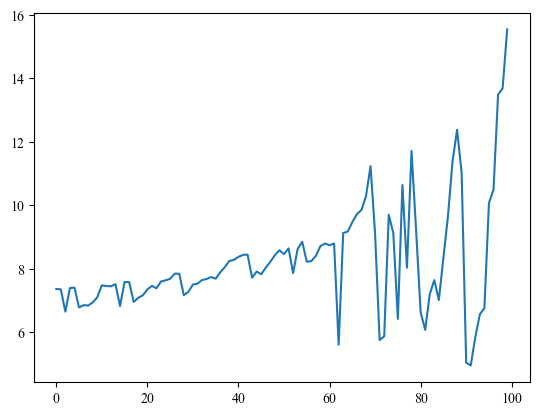

In [8]:
plt.plot(frac_pow)

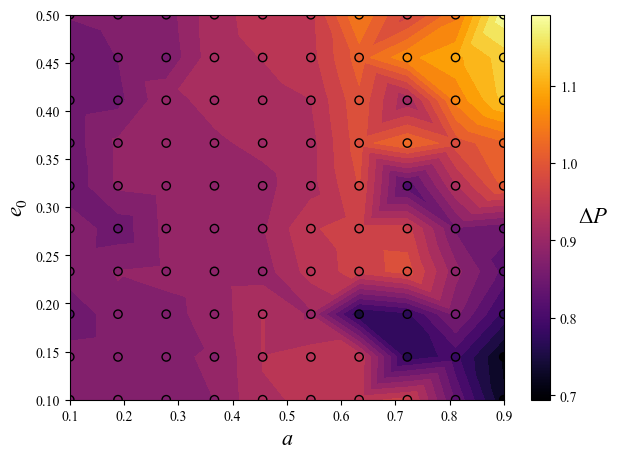

In [9]:
import matplotlib.tri as tri

x, y = param_grid[:, 0], param_grid[:, 1]

# Create a triangulation
triang = tri.Triangulation(x, y)

plt.figure(figsize=(7,5))
plt.tricontourf(triang, np.log10(np.abs((frac_pow))), cmap='inferno',levels=20)
plt.scatter(param_grid[:,0], param_grid[:,1], c = np.log10(frac_pow), cmap='inferno',edgecolor='black')
scat_cb = plt.colorbar()
scat_cb.set_label(r"$~~~~\Delta{P}$",fontsize=16,rotation = 0)
plt.xlabel(r'$a$',fontsize=16)
plt.ylabel(r'$e_0$',fontsize=16)
#plt.savefig(f'{filename}/power_difference_1e-5_vs_1e-2.png',dpi=300,bbox_inches='tight')
plt.show()

#plt.scatter(param_grid[:,0], param_grid[:,1], c = np.log10(cumsum_1e5), cmap='inferno')
#plt.colorbar()
#plt.show()

In [4]:
import matplotlib.font_manager as fm
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    #print(font)
    if "times" in font.lower():
        print(font)

/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman_Italic.ttf
/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman.ttf
/usr/share/fonts/truetype/msttcorefonts/timesbi.ttf
/usr/share/fonts/truetype/msttcorefonts/times.ttf
/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman_Bold_Italic.ttf
/usr/share/fonts/truetype/msttcorefonts/timesbd.ttf
/usr/share/fonts/truetype/msttcorefonts/timesi.ttf
/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman_Bold.ttf


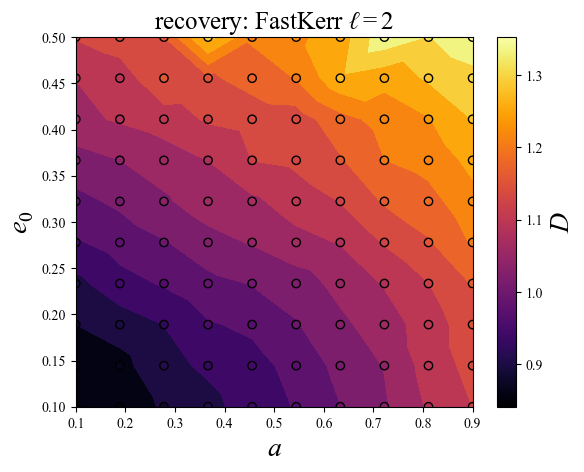

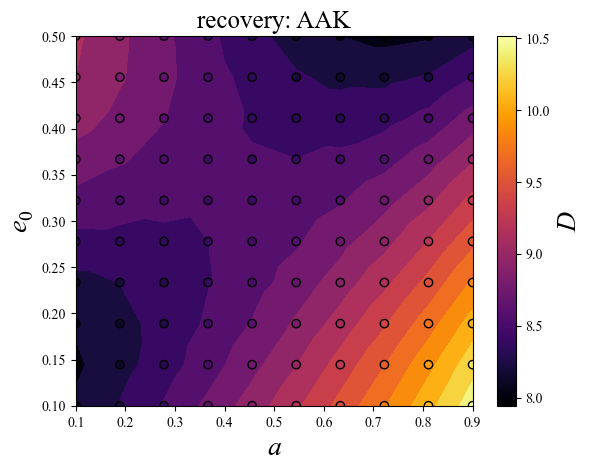

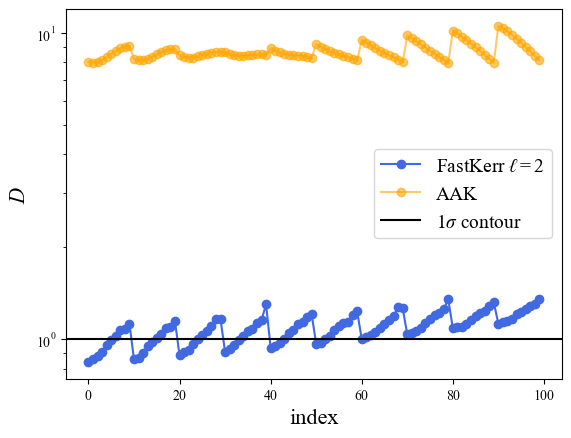

In [9]:
import matplotlib.colors as mcolors
import matplotlib.tri as tri

models_to_include = [0,5] #index of models from alternate_models_list to plot

alternate_models_list = np.array([
    'l2FastKerr',
    'l2m2FastKerr',
    'errtolFastKerr',
    'errtol3FastKerr',
    'errtol4FastKerr',
    'AAK'])
alternate_models_list = alternate_models_list[models_to_include]

alternate_models_list_plotting = np.array([
    r'FastKerr $\ell=2$',
    r'FastKerr $\ell=2,m=2$',
    r'FastKerr err=$10^{-2}$',
    r'FastKerr err=$10^{-3}$',
    r'FastKerr err=$10^{-4}$',
    'AAK'])
alternate_models_list_plotting = alternate_models_list_plotting[models_to_include]

histtype = np.array([
    'bar',
    'step',
    'stepfilled',
    'stepfilled',
    'stepfilled',
    'stepfilled'])
histtype = histtype[models_to_include]

histcolor = np.array([
    'royalblue',
    'royalblue',
    'grey',
    'royalblue',
    'grey',
    'orange'])
histcolor = histcolor[models_to_include]

alphas = np.array([
    1.0,
    1.0,
    0.8,
    0.8,
    0.8,
    0.6])
alphas = alphas[models_to_include]

edgecolor = np.array([
    None, 
    'royalblue',
    'black', 
    'black', 
    'black', 
    'red'])
edgecolor = edgecolor[models_to_include]

for j in range(len(alternate_models_list)):

    alternate_model = alternate_models_list[j]
    alt_plot = alternate_models_list_plotting[j]
    
    with h5py.File(f"{filename}/data.h5", "r") as f:
        param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
        p_range = f["p0"][:] + 0.5 #buffer

    filename_bias = os.path.join(filename,alternate_model)

    sigma_contours = []
    biased_a = []
    biased_e = []
    biases_1D = []
    for i in range(len(param_grid)):
        a = param_grid[i][0]
        e0 = param_grid[i][1]
        p0 = p_range[i]
        dist = dist_range[i]
        
        param_vals = [np.log(m1), np.log(m2), a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0]

        with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
            Fisher_transformed = f["Fisher_transformed"][:]

        with h5py.File(f"{filename_bias}/biased_params_{i}.h5","r") as f:
            biased_params = f["biased_params"][:]
            biased_a.append(biased_params[2])
            biased_e.append(biased_params[4])
            
            sigma_contours.append(np.array(f["sigma_contours"]))

        #rows_to_remove = []
        #for _ in range(len(param_names)):
        #    if param_names[_] in ['dist','qK','phiK']:
        #        rows_to_remove.append(_)

        #rows_to_remove = np.array(rows_to_remove)

        #if len(rows_to_remove) > 0:
        #    Fisher_transformed = np.delete(np.delete(Fisher_transformed,rows_to_remove,axis=0),rows_to_remove,axis=1)
        #    biased_params = np.delete(biased_params, rows_to_remove, axis=0)
        #    param_vals = np.delete(param_vals, rows_to_remove, axis=0)

        covariance = np.linalg.inv(Fisher_transformed)
        
        #biases_1D.append(np.mean(np.abs(param_vals-biased_params)/np.sqrt(np.diag(covariance))))

        #print(a, e0, sigma_contours[-1])

    sigma_contours = np.array(sigma_contours) 

    #if M < 1e6: #high-frequency FIMs more unstable
    #    mask = np.log10(sigma_contours) < 0.0
    #else: 
    #    mask = np.log10(sigma_contours) < 3 #sigma > 1000.0 not expected!
    
    #sigma_contours = sigma_contours[mask]
    #biased_a = biased_a[mask]
    #biased_e = biased_e[mask]
    #biases_1D = biases_1D[mask]
    
    #a_vals_temp = param_grid[:,0][mask]
    #e_vals_temp = param_grid[:,1][mask]

    #param_grid = np.vstack((a_vals_temp,e_vals_temp)).T

    #print(sigma_contours)

    #sigma_contours = np.log10(np.array(sigma_contours))
    #biases_1D = np.log10(biases_1D)

    #norm = mcolors.Normalize(vmin=min(biases_1D), vmax=max(biases_1D))
    #norm = mcolors.Normalize(vmin=min(sigma_contours), vmax=max(sigma_contours))
    
    plt.plot(figsize=(7,5))
    
    x, y = param_grid[:, 0], param_grid[:, 1]

    # Create a triangulation
    triang = tri.Triangulation(x, y)

    plt.tricontourf(triang, sigma_contours, cmap='inferno',levels=15)
    #plt.scatter(param_grid[:,0], param_grid[:,1], c = biases_1D, cmap='inferno')
    plt.scatter(param_grid[:,0], param_grid[:,1], c = sigma_contours, cmap='inferno',edgecolor='black')

    scat_cb = plt.colorbar()
    scat_cb.set_label(r"$D$",fontsize=20)

    biased_a = np.array(biased_a)
    biased_e = np.array(biased_e)

    #da = (biased_a - param_grid[:,0])/np.sqrt(covariance[2,2])
    #da /= (np.abs(da))
    #de = (biased_e - param_grid[:,1])/np.sqrt(covariance[4,4])
    #de /= (np.abs(de))
    #print(da, de)
    #plt.quiver(param_grid[:,0], param_grid[:,1], da, de, angles="xy", scale_units="xy", scale=1., color="r", alpha=1.0)
    #plt.scatter(biased_a, biased_e, c = 'k')
    
    #plt.contourf(a_range, e_range, sigma_contours,levels=10)
    #plt.colorbar()
    plt.xlabel(r"$a$",fontsize=20)
    plt.ylabel(r"$e_0$",fontsize=20)    
    plt.title(f"recovery: {alt_plot}",fontsize=18)
    plt.savefig(f"{filename}/{alternate_model}_sigma_contours.png",bbox_inches='tight',dpi=300)
    plt.show()


for j in range(len(alternate_models_list)):

    with h5py.File(f"{filename}/data.h5", "r") as f:
        param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
        p_range = f["p0"][:] + 0.5 #buffer

    alternate_model = alternate_models_list[j]
    alt_plot = alternate_models_list_plotting[j]
    
    filename_bias = os.path.join(filename,alternate_model)

    sigma_contours = []
    #biased_a = []
    #biased_e = []
    #biases_1D = []
    for i in range(len(param_grid)):
        
        #param_vals = [np.log(M), np.log(mu), a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0]

        #with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
        #    Fisher_transformed = f["Fisher_transformed"][:]

        with h5py.File(f"{filename_bias}/biased_params_{i}.h5","r") as f:
            #biased_params = f["biased_params"][:]
            #biased_a.append(biased_params[2])
            #biased_e.append(biased_params[4])
            
            sigma_contours.append(np.array(f["sigma_contours"]))

        #rows_to_remove = []
        #for _ in range(len(param_names)):
        #    if param_names[_] in ['dist','qK','phiK']:
        #        rows_to_remove.append(_)

        #rows_to_remove = np.array(rows_to_remove)

        #if len(rows_to_remove) > 0:
        #    Fisher_transformed = np.delete(np.delete(Fisher_transformed,rows_to_remove,axis=0),rows_to_remove,axis=1)
        #    biased_params = np.delete(biased_params, rows_to_remove, axis=0)
        #    param_vals = np.delete(param_vals, rows_to_remove, axis=0)

        #covariance = np.linalg.inv(Fisher_transformed)
        
        #biases_1D.append(np.mean(np.abs(param_vals-biased_params)/np.sqrt(np.diag(covariance))))

        #print(a, e0, sigma_contours[-1])

    sigma_contours = np.array(sigma_contours)

    #sigma_contours = sigma_contours[mask]
    #mask defined in previous loop
    
    sigma_contours = np.array(sigma_contours)
    #biases_1D = np.log10(biases_1D)
    
    plt.plot(sigma_contours,marker='o',color=histcolor[j],label=alt_plot,alpha=alphas[j])
    #plt.hist(biases_1D,bins=20,histtype=histtype[j],color=histcolor[j],label=alt_plot,alpha=alphas[j],edgecolor=edgecolor[j])
    
plt.yscale('log')
plt.axhline(1,color='black',linestyle='-',linewidth=1.5,label=r'$1\sigma$ contour')
plt.ylabel(r"$D$",fontsize=16)
plt.xlabel(r"index",fontsize=16)

plt.legend(fontsize=14)
plt.savefig(f"{filename}/histplot_sigmas.png",dpi=300,bbox_inches='tight')
plt.show()

Maha_ae_grid_Mtot_1500015.0/l2FastKerr
Maha_ae_grid_Mtot_1500015.0/AAK


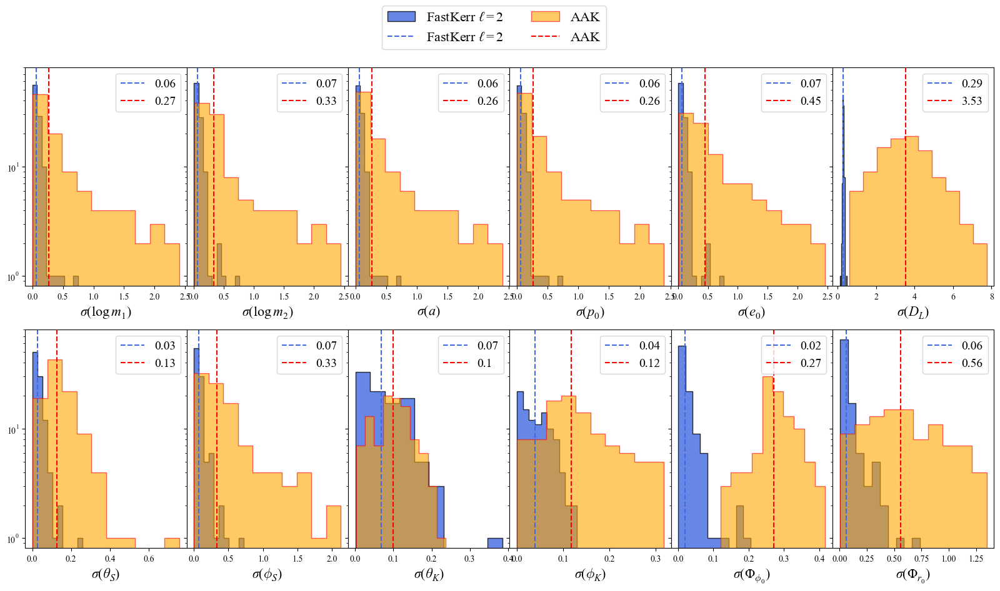

In [10]:
models_to_include = [0,3] #index of models from alternate_models_list to plot

alternate_models_list = np.array(['l2FastKerr','l2m2FastKerr','errtolFastKerr','AAK'])
alternate_models_list = alternate_models_list[models_to_include]
alternate_models_list_plotting = np.array([r'FastKerr $\ell=2$',r'FastKerr $\ell=2,m=2$',r'FastKerr err=$10^{-2}$','AAK'])
alternate_models_list_plotting = alternate_models_list_plotting[models_to_include]
histtype = np.array(['stepfilled','step','stepfilled','stepfilled'])
histtype = histtype[models_to_include]
histcolor = np.array(['royalblue','royalblue','grey','orange'])
histcolor = histcolor[models_to_include]
alphas = np.array([0.8,1.0,0.8,0.6])
alphas = alphas[models_to_include]
edgecolor = np.array(['black', 'royalblue','black', 'red'])
edgecolor = edgecolor[models_to_include]

medianline_color = np.array(['royalblue','royalblue','black','red'])
medianline_color = medianline_color[models_to_include]
medianline_style = np.array(['--','-','--','--'])
medianline_style = medianline_style[models_to_include]

fig, axs = plt.subplots(2,len(param_names)//2,figsize=(20,10),sharey=True, gridspec_kw={'wspace': 0})

logmass_sigmas = True #whether to calculate 1D sigma-biases with respect to the log mass parameterization (more stable) or not.

if logmass_sigmas:
    param_names = [r'$\log{m_1}$',r'$\log{m_2}$',r'$a$',r'$p_0$',r'$e_0$',r'$D_L$',r'$\theta_S$',r'$\phi_S$',r'$\theta_K$',r'$\phi_K$',r'$\Phi_{\phi_0}$',r'$\Phi_{r_0}$']
else:
    param_names = [r'$m_1$',r'$m_2$',r'$a$',r'$p_0$',r'$e_0$',r'$D_L$',r'$\theta_S$',r'$\phi_S$',r'$\theta_K$',r'$\phi_K$',r'$\Phi_{\phi_0}$',r'$\Phi_{r_0}$']

for j in range(len(alternate_models_list)):

    alternate_model = alternate_models_list[j]
    alt_plot = alternate_models_list_plotting[j]

    with h5py.File(f"{filename}/data.h5", "r") as f:
        param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
        p_range = f["p0"][:] + 0.5 #buffer
        dist_range = f["dists"][:]  # Read the dataset into a NumPy array

    a_range = np.linspace(0.1,0.9,N)
    e_range = np.linspace(0.1,0.5,N) #eccentricity above 0.5 is extremely expensive already...

    filename_bias = os.path.join(filename,alternate_model)
    print(filename_bias)
    
    sigma_contours = []
    #biased_a = []
    #biased_e = []
    biases_1D = []
    sigmas_1D = []
    truevals_1D = []
    for i in range(len(param_grid)):
        a = param_grid[i][0]
        e0 = param_grid[i][1]
        p0 = p_range[i]
        dist = dist_range[i]

        if logmass_sigmas:
            truevals_1D.append([np.log(m1), np.log(m2), a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0])
        else:
            truevals_1D.append([m1, m2, a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0])

        with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
            if logmass_sigmas:
                Fisher_transformed = f["Fisher_transformed"][:]
            else:
                Fisher = f["Fisher"][:]

        if logmass_sigmas:
            covariance_transformed = np.linalg.inv(Fisher_transformed)
        else:
            covariance = np.linalg.inv(Fisher)

        if logmass_sigmas:
            sigmas_1D.append(np.sqrt(np.diag(covariance_transformed)))
        else:
            sigmas_1D.append(np.sqrt(np.diag(covariance)))

        with h5py.File(f"{filename_bias}/biased_params_{i}.h5","r") as f:
            biased_params = f["biased_params"][:]

            if not logmass_sigmas:
                biased_params[:2] = np.exp(biased_params[:2])
            #sigma_contours.append(np.array(f["sigma_contours"]))

        biases_1D.append(biased_params)

    biases_1D = np.array(biases_1D)
    sigmas_1D = np.array(sigmas_1D)
    truevals_1D = np.array(truevals_1D)

    sigmabias_1D = np.abs(biases_1D - truevals_1D)/sigmas_1D

    #mask = (sigmabias_1D[:,0] < 1)# & (sigmabias_1D[:,5] < 10) & (sigmabias_1D[:,4] < 2) & (sigmabias_1D[:,-2] < 1) & (sigmabias_1D[:,-1] < 1) & (sigmabias_1D[:,6] < 1) 
    #mask = (sigmabias_1D[:,2] < 1) & (sigmabias_1D[:,4] < 2) & (sigmabias_1D[:,6] < 1.25) #empirical mask 
    
    #sigmabias_1D = sigmabias_1D[mask]

    #print("#excluded points: ", sum(~mask))

    for i in range(len(param_names)):
        if i < len(param_names)//2:
            axs[0,i].hist(sigmabias_1D[:,i],histtype=histtype[j],color=histcolor[j],alpha=alphas[j],edgecolor=edgecolor[j])
            axs[0,i].set_xlabel(r"$\sigma($" + rf"{param_names[i]})",fontsize=16)
            axs[0,i].set_yscale('log')
        else:
            axs[1,i-len(param_names)//2].hist(sigmabias_1D[:,i],histtype=histtype[j],color=histcolor[j],alpha=alphas[j],edgecolor=edgecolor[j])
            axs[1,i-len(param_names)//2].set_xlabel(r"$\sigma($" + rf"{param_names[i]})",fontsize=16)
            axs[1,i-len(param_names)//2].set_yscale('log')

        if i < len(param_names)//2:
            axs[0,i].axvline(np.median(sigmabias_1D[:,i]),linestyle=medianline_style[j],color=medianline_color[j],label=round(np.median(sigmabias_1D[:,i]), 2))
            axs[0,i].legend(fontsize=14)
        else:
            axs[1,i-len(param_names)//2].axvline(np.median(sigmabias_1D[:,i]),linestyle=medianline_style[j],color=medianline_color[j],label=round(np.median(sigmabias_1D[:,i]), 2))
            axs[1,i-len(param_names)//2].legend(fontsize=14)

fig.legend(labels = np.vstack((alternate_models_list_plotting,alternate_models_list_plotting)).ravel('F'), loc="upper center", bbox_to_anchor=(0.5, 0.99), ncol=2,fontsize=16)
plt.savefig(f"{filename}/1D_bias_comparison.png",dpi=300,bbox_inches='tight',transparent=False)
plt.show()

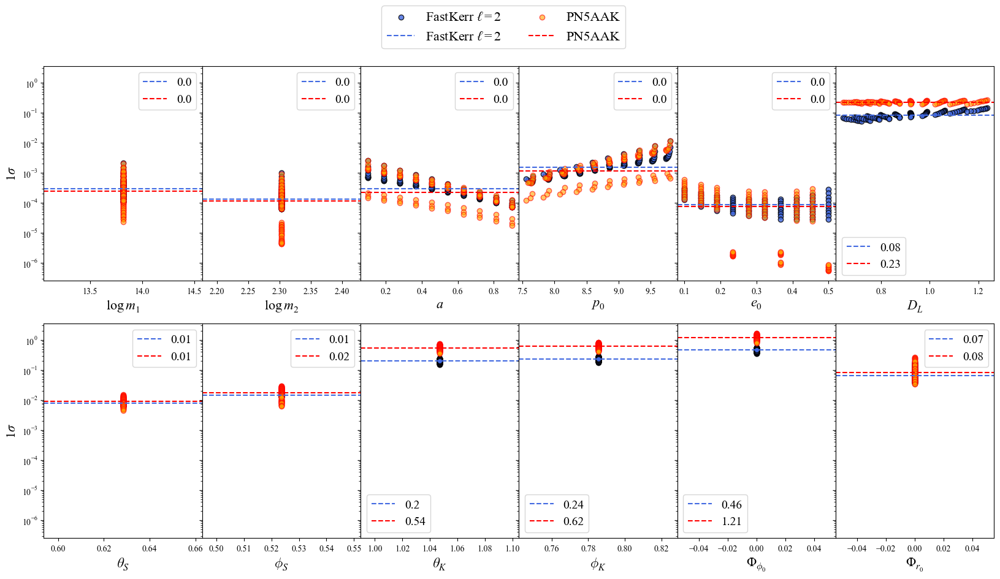

In [26]:
models_to_include = [0,3] #index of models from alternate_models_list to plot

alternate_models_list = np.array(['l2FastKerr','l2m2FastKerr','errtolFastKerr','Pn5AAKWaveform'])
alternate_models_list = alternate_models_list[models_to_include]
alternate_models_list_plotting = np.array([r'FastKerr $\ell=2$',r'FastKerr $\ell=2,m=2$',r'FastKerr err=$10^{-2}$','PN5AAK'])
alternate_models_list_plotting = alternate_models_list_plotting[models_to_include]
histtype = np.array(['stepfilled','step','stepfilled','stepfilled'])
histtype = histtype[models_to_include]
histcolor = np.array(['royalblue','royalblue','grey','orange'])
histcolor = histcolor[models_to_include]
alphas = np.array([0.8,1.0,0.8,0.6])
alphas = alphas[models_to_include]
edgecolor = np.array(['black', 'royalblue','black', 'red'])
edgecolor = edgecolor[models_to_include]

medianline_color = np.array(['royalblue','royalblue','black','red'])
medianline_color = medianline_color[models_to_include]
medianline_style = np.array(['--','-','--','--'])
medianline_style = medianline_style[models_to_include]

param_names = [r'$\log{m_1}$',r'$\log{m_2}$',r'$a$',r'$p_0$',r'$e_0$',r'$D_L$',r'$\theta_S$',r'$\phi_S$',r'$\theta_K$',r'$\phi_K$',r'$\Phi_{\phi_0}$',r'$\Phi_{r_0}$']

fig, axs = plt.subplots(2,len(param_names)//2,figsize=(20,10),sharey=True, gridspec_kw={'wspace': 0.0})

for j in range(len(alternate_models_list)):

    alternate_model = alternate_models_list[j]
    alt_plot = alternate_models_list_plotting[j]

    with h5py.File(f"{filename}/data.h5", "r") as f:
        param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
        p_range = f["p0"][:] + 0.5 #buffer
        dist_range = f["dists"][:]  # Read the dataset into a NumPy array

    a_range = np.linspace(0.1,0.9,N)
    e_range = np.linspace(0.1,0.5,N) #eccentricity above 0.5 is extremely expensive already...

    filename_bias = os.path.join(filename,alternate_model)

    sigma_contours = []
    #biased_a = []
    #biased_e = []
    biases_1D = []
    sigmas_1D = []
    truevals_1D = []
    for i in range(len(param_grid)):
        a = param_grid[i][0]
        e0 = param_grid[i][1]
        p0 = p_range[i]
        dist = dist_range[i]
        
        truevals_1D.append([np.log(m1), np.log(m2), a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0])

        with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
            Fisher_transformed = f["Fisher_transformed"][:]
            #Fisher = f["Fisher"][:]

        covariance_transformed = np.linalg.inv(Fisher_transformed)
        #covariance = np.linalg.inv(Fisher)
        
        sigmas_1D.append(np.sqrt(np.diag(covariance_transformed)))
        #sigmas_1D.append(np.sqrt(np.diag(covariance)))

        with h5py.File(f"{filename_bias}/biased_params_{i}.h5","r") as f:
            biased_params = f["biased_params"][:]
            #sigma_contours.append(np.array(f["sigma_contours"]))

        biases_1D.append(biased_params)

    biases_1D = np.array(biases_1D)
    sigmas_1D = np.array(sigmas_1D)
    truevals_1D = np.array(truevals_1D)

    for i in range(len(param_names)):
        
        if i < len(param_names)//2:
            axs[0,i].scatter(truevals_1D[:,i],sigmas_1D[:,i],color=histcolor[j],alpha=alphas[j],edgecolor=edgecolor[j])
            axs[0,i].set_xlabel(rf"{param_names[i]}",fontsize=16)
            axs[0,i].set_yscale('log')
        else:
            axs[1,i-len(param_names)//2].scatter(truevals_1D[:,i],sigmas_1D[:,i],color=histcolor[j],alpha=alphas[j],edgecolor=edgecolor[j])
            axs[1,i-len(param_names)//2].set_xlabel(rf"{param_names[i]}",fontsize=16)
            axs[1,i-len(param_names)//2].set_yscale('log')

        if i < len(param_names)//2:
            axs[0,i].axhline(np.median(sigmas_1D[:,i]),linestyle=medianline_style[j],color=medianline_color[j],label=round(np.median(sigmas_1D[:,i]), 2))
            axs[0,i].legend(fontsize=14)
        else:
            axs[1,i-len(param_names)//2].axhline(np.median(sigmas_1D[:,i]),linestyle=medianline_style[j],color=medianline_color[j],label=round(np.median(sigmas_1D[:,i]), 2))
            axs[1,i-len(param_names)//2].legend(fontsize=14)

axs[0,0].set_ylabel(r"$1\sigma$",fontsize=16)
axs[1,0].set_ylabel(r"$1\sigma$",fontsize=16)
fig.legend(labels = np.vstack((alternate_models_list_plotting,alternate_models_list_plotting)).ravel('F'), loc="upper center", bbox_to_anchor=(0.5, 0.99), ncol=2,fontsize=16)
plt.savefig(f"{filename}/1D_sigmas_comparison.png",dpi=300,bbox_inches='tight',transparent=False)
plt.show()

In [343]:
models_to_include = [0, 2] #index of models from alternate_models_list to plot

alternate_models_list = np.array(['l2FastKerr','l2m2FastKerr','errtolFastKerr','Pn5AAKWaveform'])
alternate_models_list = alternate_models_list[models_to_include]
alternate_models_list_plotting = np.array([r'FastKerr $\ell=2$',r'FastKerr $\ell=2,m=2$',r'FastKerr err=$10^{-2}$','PN5AAK'])
alternate_models_list_plotting = alternate_models_list_plotting[models_to_include]

alphas = np.array([0.8,1.0,0.8,0.6])
alphas = alphas[models_to_include]
edgecolor = np.array(['black', 'royalblue','black', 'red'])
edgecolor = edgecolor[models_to_include]
facecolor = np.array(['royalblue', 'royalblue','None', 'red'])
facecolor = facecolor[models_to_include]

medianline_color = np.array(['royalblue','royalblue','black','red'])
medianline_color = medianline_color[models_to_include]
medianline_style = np.array(['--','-','--','--'])
medianline_style = medianline_style[models_to_include]

param_names = [r'$\log{M}$',r'$\log{\mu}$',r'$a$',r'$p_0$',r'$e_0$',r'$D_L$',r'$\theta_S$',r'$\phi_S$',r'$\theta_K$',r'$\phi_K$',r'$\Phi_{\phi_0}$',r'$\Phi_{r_0}$']
    
for j in range(len(alternate_models_list)):

    alternate_model = alternate_models_list[j]
    alt_plot = alternate_models_list_plotting[j]

    with h5py.File(f"{filename}/data.h5", "r") as f:
        param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
        p_range = f["p0"][:] + 0.1 #buffer
    
    filename_bias = os.path.join(filename,alternate_model)

    sigma_contours = []
    #biased_a = []
    #biased_e = []
    biases_1D = []
    sigmas_1D = []
    truevals_1D = []
    for i in range(len(param_grid)):
        a = param_grid[i][0]
        e0 = param_grid[i][1]
        p0 = p_range[i]

        truevals_1D.append([np.log(M), np.log(mu), a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0])

        with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
            Fisher_transformed = f["Fisher_transformed"][:]

        covariance_transformed = np.linalg.inv(Fisher_transformed)

        sigmas_1D.append(np.sqrt(np.diag(covariance_transformed)))

        with h5py.File(f"{filename_bias}/biased_params_{i}.h5","r") as f:
            biased_params = f["biased_params"][:]
            #sigma_contours.append(np.array(f["sigma_contours"]))

        biases_1D.append(biased_params)

    biases_1D = np.array(biases_1D)
    
    sigmas_1D = np.array(sigmas_1D)
    truevals_1D = np.array(truevals_1D)

    sigmabias_1D = np.abs(biases_1D - truevals_1D)/sigmas_1D

    #skip every other point
    sigmabias_1D = sigmabias_1D.reshape(N,N,len(truevals_1D[0]))
    param_grid = param_grid.reshape(N,N,2)
    biases_1D = biases_1D.reshape(N, N, len(truevals_1D[0]))
    
    sparse_N = 1 #decrease points along the grid
    sigmabias_1D = sigmabias_1D[::sparse_N, ::sparse_N, :]
    sigmabias_1D = sigmabias_1D.reshape(sigmabias_1D.shape[0]*sigmabias_1D.shape[1],sigmabias_1D.shape[2])
    param_grid = param_grid[::sparse_N, ::sparse_N]
    param_grid = param_grid.reshape(param_grid.shape[0]*param_grid.shape[1],2)
    biases_1D = biases_1D[::sparse_N, ::sparse_N]
    biases_1D = biases_1D.reshape(biases_1D.shape[0]*biases_1D.shape[1],biases_1D.shape[2])
    
    mask = (sigmabias_1D[:,2] < 4) & (sigmabias_1D[:,4] < 4) 
    #mask = (sigmabias_1D[:,2] < 1) & (sigmabias_1D[:,4] < 2) & (sigmabias_1D[:,5] < 10) & (sigmabias_1D[:,-2] < 1) & (sigmabias_1D[:,-1] < 1) & (sigmabias_1D[:,6] < 1)
    sigmabias_1D = sigmabias_1D[mask]

    biases_1D = biases_1D[mask]
    
    a_vals_temp = param_grid[:,0][mask]
    e_vals_temp = param_grid[:,1][mask]
    param_grid = np.vstack((a_vals_temp,e_vals_temp)).T

    print("#excluded points: ", sum(~mask))

    #extracting required axes
    axes_to_plot = [2,4] #[a = 2, e0 = 4, dist = 5, qK = 8, phiK = 9]
    sigmabias_1D = sigmabias_1D[:,axes_to_plot]
    #print(biases_1D.shape)

    biases_1D = biases_1D[:,axes_to_plot]
    
    delta = 1000. #np.array([1e-1,1e-1]) #scaling parameter
    biased_represent = biases_1D # - param_grid)/sigmabias_1D

    dx = delta*(biased_represent[:,0] - param_grid[:,0])/sigmabias_1D[:,0] #variation in x-axis
    
    dy = delta*(biased_represent[:,1] - param_grid[:,1])/sigmabias_1D[:,1] #variation in y-axis

    C = np.hypot(dx, dy)
    
    fig = plt.figure()
    axs = fig.add_subplot(111)
    q = axs.quiver(param_grid[:,0], param_grid[:,1], dx, dy, C, angles="xy", scale_units="xy", scale=1., cmap = 'inferno', linewidth=2, headwidth=5, headlength=3, headaxislength=3, alpha=1.0)
    axs.set_facecolor('white')
    scat_cb = plt.colorbar(q)
    scat_cb.set_label(r"$|\vec{b}|$",fontsize=16)
    plt.xlabel(r"$a$",fontsize=16)
    plt.ylabel(r"$e_0$",fontsize=16)    
    plt.title(f"recovery: {alt_plot}")
    #plt.savefig(f"{filename}/{alternate_model}_bias_grid_visual.png",bbox_inches='tight',dpi=300)
    plt.close()

#excluded points:  2
#excluded points:  6


#excluded points:  0


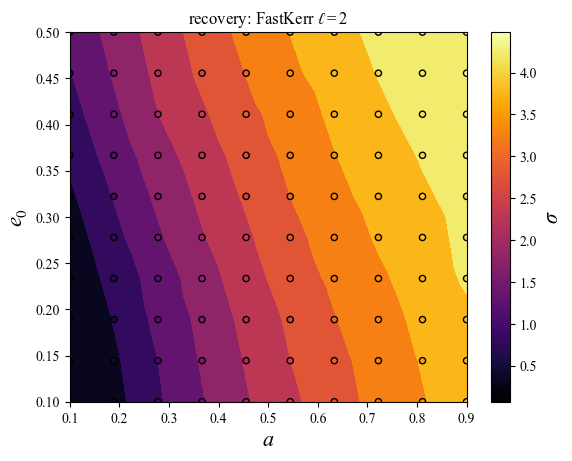

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'Maha_ae_grid_Mtot_1000010.0/errtolFastKerr/Fisher_0.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [11]:
models_to_include = [0, 2] #index of models from alternate_models_list to plot

alternate_models_list = np.array(['l2FastKerr','l2m2FastKerr','errtolFastKerr','Pn5AAKWaveform'])
alternate_models_list = alternate_models_list[models_to_include]
alternate_models_list_plotting = np.array([r'FastKerr $\ell=2$',r'FastKerr $\ell=2,m=2$',r'FastKerr err=$10^{-2}$','PN5AAK'])
alternate_models_list_plotting = alternate_models_list_plotting[models_to_include]

alphas = np.array([0.8,1.0,0.8,0.6])
alphas = alphas[models_to_include]
edgecolor = np.array(['black', 'royalblue','black', 'red'])
edgecolor = edgecolor[models_to_include]
facecolor = np.array(['royalblue', 'royalblue','None', 'red'])
facecolor = facecolor[models_to_include]

medianline_color = np.array(['royalblue','royalblue','black','red'])
medianline_color = medianline_color[models_to_include]
medianline_style = np.array(['--','-','--','--'])
medianline_style = medianline_style[models_to_include]

param_names = [r'$\log{M}$',r'$\log{\mu}$',r'$a$',r'$p_0$',r'$e_0$',r'$D_L$',r'$\theta_S$',r'$\phi_S$',r'$\theta_K$',r'$\phi_K$',r'$\Phi_{\phi_0}$',r'$\Phi_{r_0}$']
    
for j in range(len(alternate_models_list)):

    alternate_model = alternate_models_list[j]
    alt_plot = alternate_models_list_plotting[j]

    with h5py.File(f"{filename}/data.h5", "r") as f:
        param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
        p_range = f["p0"][:] + 0.1 #buffer

    a_range = np.linspace(0.1,0.9,N)
    e_range = np.linspace(0.1,0.5,N) #eccentricity above 0.5 is extremely expensive already...

    filename_bias = os.path.join(filename,alternate_model)

    sigma_contours = []
    #biased_a = []
    #biased_e = []
    biases_1D = []
    sigmas_1D = []
    truevals_1D = []
    for i in range(len(param_grid)):
        a = param_grid[i][0]
        e0 = param_grid[i][1]
        p0 = p_range[i]

        truevals_1D.append([np.log(m1), np.log(m2), a, p0, e0, dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0])

        with h5py.File(f"{filename_bias}/Fisher_{i}.h5", "r") as f:
            Fisher_transformed = f["Fisher_transformed"][:]

        covariance_transformed = np.linalg.inv(Fisher_transformed)

        sigmas_1D.append(np.sqrt(np.diag(covariance_transformed)))

        with h5py.File(f"{filename_bias}/biased_params_{i}.h5","r") as f:
            biased_params = f["biased_params"][:]
            #sigma_contours.append(np.array(f["sigma_contours"]))

        biases_1D.append(biased_params)

    biases_1D = np.array(biases_1D)
    sigmas_1D = np.array(sigmas_1D)
    truevals_1D = np.array(truevals_1D)

    sigmabias_1D = np.abs(biases_1D - truevals_1D)/sigmas_1D

    mask = (sigmabias_1D[:,2] < 1) & (sigmabias_1D[:,4] < 2) & (sigmabias_1D[:,6] < 1.25) #empirical mask

    sigmabias_1D = sigmabias_1D[mask]
    a_vals_temp = param_grid[:,0][mask]
    e_vals_temp = param_grid[:,1][mask]
    param_grid = np.vstack((a_vals_temp,e_vals_temp)).T

    print("#excluded points: ", sum(~mask))

    #extracting required axes
    axes_to_plot = [5] #[a = 2, e0 = 4, dist = 5, qK = 8, phiK = 9]
    sigmabias_1D = np.mean(sigmabias_1D[:,axes_to_plot],axis=1)

    delta = 20
    
    fig = plt.figure()
    axs = fig.add_subplot(111)
    x, y = param_grid[:, 0], param_grid[:, 1]

    # Create a triangulation
    triang = tri.Triangulation(x, y)

    axs.tricontourf(triang, sigmabias_1D, cmap='inferno',levels=10)
    q = axs.scatter(param_grid[:,0], param_grid[:,1], s = 20, c = sigmabias_1D, edgecolor='k',cmap = 'inferno', alpha=1.0)
    axs.set_facecolor('white')
    scat_cb = plt.colorbar(q)
    scat_cb.set_label(r"$\sigma$",fontsize=16)
    plt.xlabel(r"$a$",fontsize=16)
    plt.ylabel(r"$e_0$",fontsize=16)    
    plt.title(f"recovery: {alt_plot}")
    plt.savefig(f"{filename}/{alternate_model}_bias_grid_visual_extrinsic.png",bbox_inches='tight',dpi=300)
    plt.show()

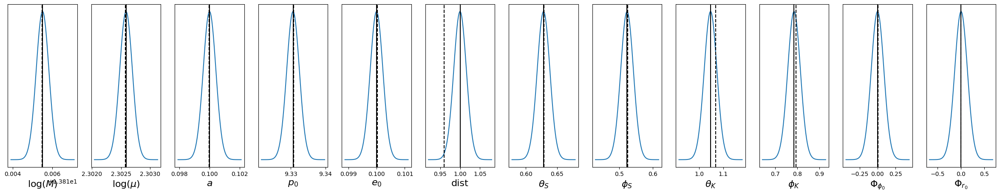

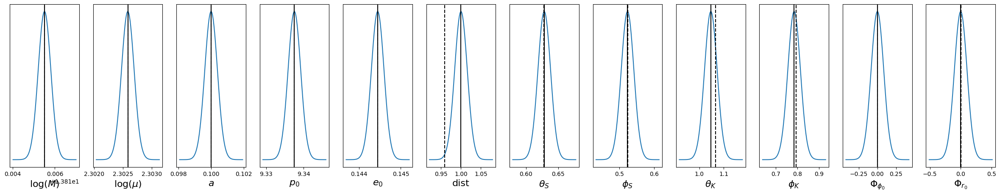

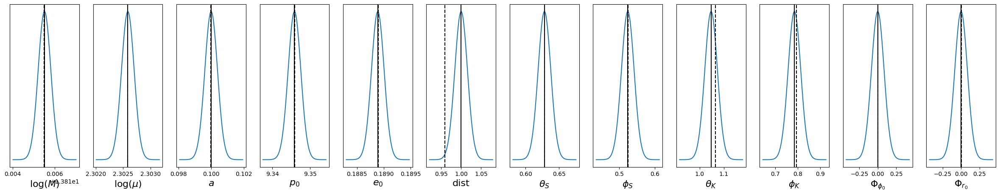

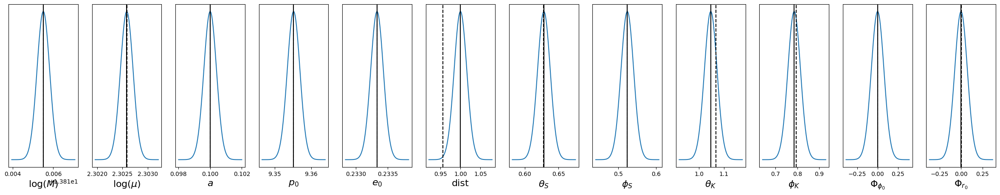

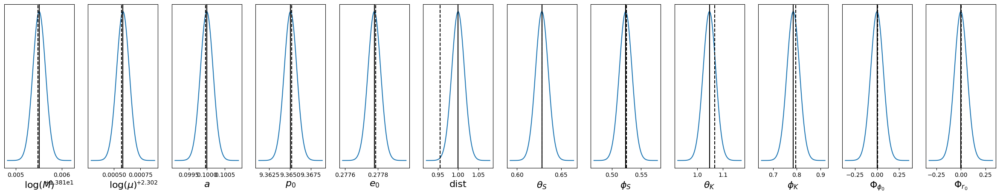

...

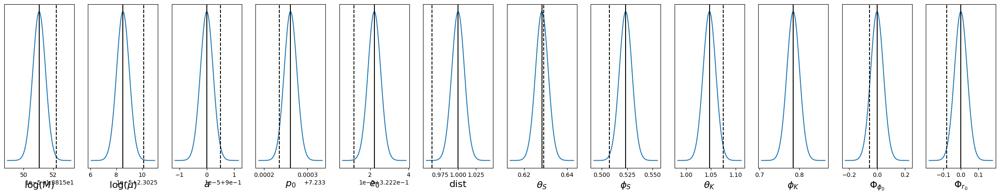

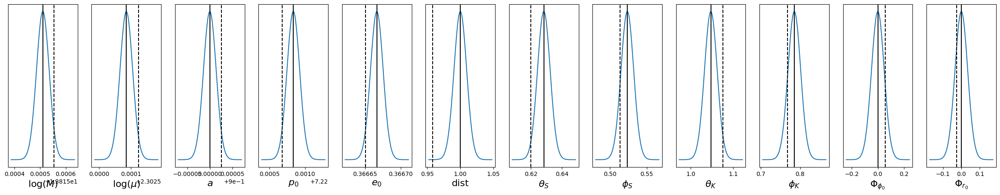

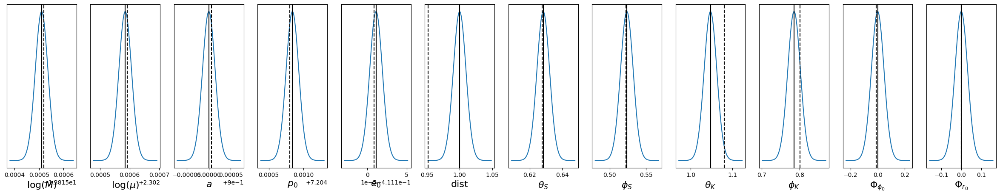

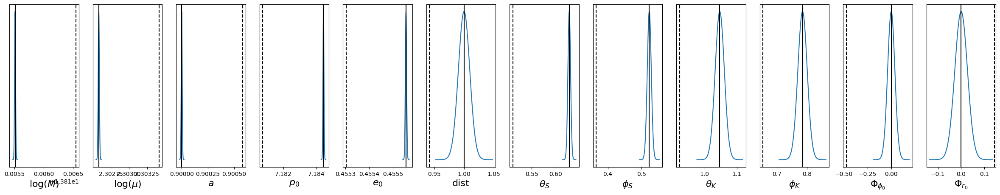

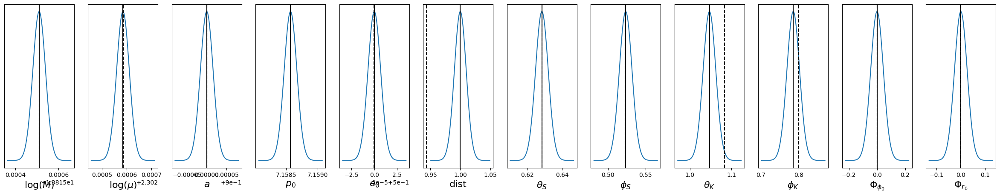

In [18]:
from scipy.stats import norm

with h5py.File(f"{filename}/data.h5", "r") as f:
    param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
    p_range = f["p0"][:] + 0.1 #buffer

#alternate_models_list = ['l2FastKerr','errtolFastKerr','Pn5AAKWaveform']
#alternate_models_list_plotting = [r'FastKerr $\ell=2$',r'FastKerr err=$10^{-2}$','PN5AAK']

alternate_models_list = ['errtolFastKerr']
alternate_models_list_plotting = [r'FastKerr err=$10^{-2}$']

param_names = [r'$\log(M)$',r'$\log(\mu)$',r'$a$',r'$p_0$',r'$e_0$',r'dist',r'$\theta_S$',r'$\phi_S$',r'$\theta_K$',r'$\phi_K$',r'$\Phi_{\phi_0}$',r'$\Phi_{r_0}$']
#param_names = [r'$a$',r'$e_0$']

for i in range(len(alternate_models_list)):
    alternate_model = alternate_models_list[i]
    filename_bias = os.path.join(filename,alternate_model)
    
    #dist_sigma = []
    
    for j in range(len(param_grid)):
        with h5py.File(f"{filename_bias}/Fisher_{j}.h5", "r") as f:
            Fisher_transformed = f["Fisher_transformed"][:]

        with h5py.File(f"{filename_bias}/biased_params_{j}.h5","r") as f:
            biased_params = f["biased_params"][:]
            
            #biased_params = [biased_params[2],biased_params[4]]
            
            #sigma_contours.append(np.array(f["sigma_contours"]))

        param_vals = [np.log(M), np.log(mu), param_grid[j,0], p_range[j], param_grid[j,1], dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0]
        #param_vals = [param_grid[j,0],param_grid[j,1]]

        covariance_transformed = np.linalg.inv(Fisher_transformed)
        
        #plot the 1D marginals

        fig, axs = plt.subplots(1, len(param_names),figsize=(5*len(param_vals)/2,5))

        for k in range(len(param_names)):
            #plot the normal approximation at the truth
            sigma = np.sqrt(covariance_transformed[k,k])
            x = np.linspace(param_vals[k] - 5*sigma, param_vals[k] + 5*sigma, 100)
            axs[k].plot(x, norm.pdf(x, loc = param_vals[k], scale = sigma)) #scale = variance.
            axs[k].axvline(biased_params[k],color='k',linestyle='--')
            axs[k].axvline(param_vals[k],color='k',linestyle='-')
            axs[k].set_xlabel(param_names[k],fontsize=16)
            
            axs[k].set_yticks([])
        plt.show()
        

        #dist_sigma.append((biased_params[5]-param_vals[5])/np.sqrt(np.linalg.inv(Fisher_transformed)[5,5]))

    #plt.hist(dist_sigma)
    
#plt.show()

In [ ]:
import corner
from numpy.random import multivariate_normal

with h5py.File(f"{filename}/data.h5", "r") as f:
    param_grid = f["gridpoints"][:]  # Read the dataset into a NumPy array
    p_range = f["p0"][:] + 0.1 #buffer

alternate_models_list = ['l2FastKerr','errtolFastKerr','Pn5AAKWaveform']
alternate_models_list_plotting = [r'FastKerr $\ell=2$',r'FastKerr err=$10^{-2}$','PN5AAK']

param_names = [r'$\log(M)$',r'$\log(\mu)$',r'$a$',r'$p_0$',r'$e_0$',r'dist',r'$\theta_S$',r'$\phi_S$',r'$\theta_K$',r'$\phi_K$',r'$\Phi_{\phi_0}$',r'$\Phi_{r_0}$']
#param_names = [r'$a$',r'$e_0$']

for i in range(len(alternate_models_list)):
    alternate_model = alternate_models_list[i]
    filename_bias = os.path.join(filename,alternate_model)
    
    #dist_sigma = []
    
    for j in range(len(param_grid)):
        with h5py.File(f"{filename_bias}/Fisher_{j}.h5", "r") as f:
            Fisher_transformed = f["Fisher_transformed"][:]

        param_vals = [np.log(M), np.log(mu), param_grid[j,0], p_range[j], param_grid[j,1], dist, qS, phiS, qK, phiK, Phi_phi0, Phi_r0]

        covariance_transformed = np.linalg.inv(Fisher_transformed)

        Fisher_samples = multivariate_normal(mean = param_vals, cov = covariance_transformed, size = int(1e3))

        corner.corner(Fisher_samples)

        plt.show()